### Localized GP attempt

##### Loading dataset

In [13]:
import json
import pandas as pd
import numpy as np

# Load the JSON data from the file 'grouped_data.json'
with open('grouped_data.json', 'r') as file:
    data_dict = json.load(file)

# Initialize a list to store the records
records = []

# Iterate over each date and its corresponding time-value pairs
for date_str, time_values in data_dict.items():
    for time_str, value_str in time_values:
        # Combine date and time into a single datetime string
        datetime_str = f"{date_str} {time_str}"
        # Parse the datetime string into a datetime object
        datetime_obj = pd.to_datetime(datetime_str, format='%Y-%m-%d %H:%M:%S')
        # Convert the value to a float
        value = float(value_str)
        # Append the record to the list
        records.append({'datetime': datetime_obj, 'value': value})

# Create a DataFrame from the records
df = pd.DataFrame(records)

# Optional: Set 'datetime' as the index of the DataFrame
df.set_index('datetime', inplace=True)

# Display the first few rows of the DataFrame
print(df.head())


                       value
datetime                    
2022-07-21 04:16:01  71.0000
2022-07-21 04:18:32  72.0007
2022-07-21 04:21:13  70.0000
2022-07-21 04:29:42  70.0000
2022-07-21 04:34:57  69.0000


In [14]:
if not df.index.is_unique:
    print("Index is not unique. Aggregating duplicates by taking the mean.")
    df = df.groupby(df.index).mean()

df.shape

Index is not unique. Aggregating duplicates by taking the mean.


(397012, 1)

##### EDA

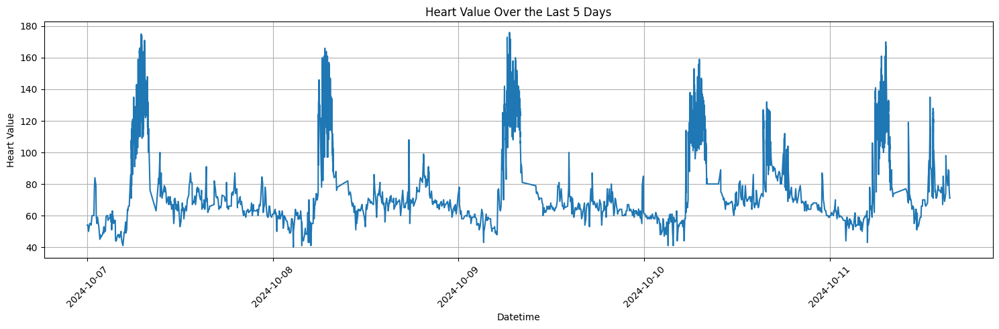

In [15]:
import matplotlib.pyplot as plt

# Ensure the DataFrame is sorted by datetime
df.sort_index(inplace=True)

# Get the last date in the data
last_date = df.index.max().date()

# Calculate the date 4 days before the last date to include 5 days in total
start_date = last_date - pd.Timedelta(days=4)

# Create a mask to select data within the date range
mask = (df.index.date >= start_date) & (df.index.date <= last_date)
df_5days = df.loc[mask]

# Plot the 'value' over time for the last 5 days
plt.figure(figsize=(15, 5))
plt.plot(df_5days.index, df_5days['value'], linestyle='-')
plt.title('Heart Value Over the Last 5 Days')
plt.xlabel('Datetime')
plt.ylabel('Heart Value')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


In [16]:
import pandas as pd

# Ensure the datetime index is in place
df.index = pd.to_datetime(df.index)

# Group the data by day and count the number of values per day
daily_counts = df.resample('D').count()

# Calculate the average number of values per day
average_values_per_day = daily_counts['value'].mean()

print("Average number of values per day:", average_values_per_day)


Average number of values per day: 487.72972972972974


##### Train Test Split

In [17]:
# Split the DataFrame
train_df = df.iloc[:int(len(df)*0.7)].copy()
test_df = df.iloc[int(len(df)*0.7):].copy()

# Display the first few rows of each split to verify
print("\nTraining Set:")
print(train_df.head())

print("\nTesting Set:")
print(test_df.head())



Training Set:
                       value
datetime                    
2022-07-21 04:16:01  71.0000
2022-07-21 04:18:32  72.0007
2022-07-21 04:21:13  70.0000
2022-07-21 04:29:42  70.0000
2022-07-21 04:34:57  69.0000

Testing Set:
                     value
datetime                  
2024-05-18 20:35:28   83.0
2024-05-18 20:35:33   85.0
2024-05-18 20:35:38   85.0
2024-05-18 20:35:43   89.0
2024-05-18 20:35:48   92.0


In [18]:
# Check the last date in the training set
last_train_date = train_df.index.max()
print(f"Last date in Training Set: {last_train_date}")

# Check the first date in the testing set
first_test_date = test_df.index.min()
print(f"First date in Testing Set: {first_test_date}")

# Ensure there is no overlap
if last_train_date < first_test_date:
    print("\nData split is correct with no overlap.")
else:
    print("\nWarning: There is an overlap between training and testing sets.")


Last date in Training Set: 2024-05-18 20:35:23
First date in Testing Set: 2024-05-18 20:35:28

Data split is correct with no overlap.


##### Creating MCAR missing data in train_df

In [19]:
def introduce_mcar_missingness(df, missing_percentage, seed=None):
    """
    Introduce MCAR missingness into the DataFrame.
    
    Parameters:
    - df: pandas DataFrame with a 'value' column.
    - missing_percentage: float, percentage of data to be missing (0-100).
    - seed: int, random seed for reproducibility.
    
    Returns:
    - df_mcar: DataFrame with missing values introduced.
    """
    if seed is not None:
        np.random.seed(seed)
    
    df_mcar = df.copy()
    
    # Total number of data points
    total_data_points = len(df_mcar)
    
    # Number of missing values to introduce
    num_missing = int(total_data_points * (missing_percentage / 100))
    
    # Randomly choose indices to be set as missing
    missing_indices = np.random.choice(df_mcar.index, size=num_missing, replace=False)
    
    # Assign NaN to the selected indices
    df_mcar.loc[missing_indices, 'value'] = np.nan
    
    return df_mcar

In [20]:
# Desired missing percentages
missing_percentages = [10, 20, 30, 40]

# Dictionary to store the missing data splits
train_df_mcar = {}

# Seed for reproducibility
seed = 42

for perc in missing_percentages:
    train_df_mcar[perc] = introduce_mcar_missingness(train_df, missing_percentage=perc, seed=seed)
    print(f"Introduced {perc}% MCAR missingness into training data.")

# Assign to separate variables for convenience
train_df_mcar_10 = train_df_mcar[10]
train_df_mcar_20 = train_df_mcar[20]
train_df_mcar_30 = train_df_mcar[30]
train_df_mcar_40 = train_df_mcar[40]


Introduced 10% MCAR missingness into training data.
Introduced 20% MCAR missingness into training data.
Introduced 30% MCAR missingness into training data.
Introduced 40% MCAR missingness into training data.


##### GP fitting trials

In [21]:
# Display the number of missing values
print("Original Training Set Missing Values:", train_df.isna().sum())
print("Training Set with 40% MCAR Missingness:", train_df_mcar_40.isna().sum())


Original Training Set Missing Values: value    0
dtype: int64
Training Set with 40% MCAR Missingness: value    111163
dtype: int64


In [22]:
train_df_mcar_10.head()

,value
datetime,
2022-07-21 04:16:01,71.0000
2022-07-21 04:18:32,72.0007
2022-07-21 04:21:13,70.0000
2022-07-21 04:29:42,70.0000
2022-07-21 04:34:57,69.0000


In [23]:
duplicate_indices = train_df.index[train_df.index.duplicated()].unique()

print("Duplicate indices:", duplicate_indices)

Duplicate indices: DatetimeIndex([], dtype='datetime64[ns]', name='datetime', freq=None)


##### predicting mcar10 df

In [24]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.preprocessing import StandardScaler
from sklearn.exceptions import ConvergenceWarning
import numpy as np
import pandas as pd
import warnings

# Assume train_df and train_df_mcar_40 are already defined and loaded

# 2. Copy the DataFrame to avoid modifying the original
train_df_imputed_local = train_df_mcar_10.copy()

# 1. Ensure the DataFrame index is unique
if not train_df_imputed_local.index.is_unique:
    print("Index is not unique. Aggregating duplicates by taking the mean.")
    # Aggregate duplicates by taking the mean of their 'value's
    train_df_imputed_local = train_df_imputed_local.groupby(train_df_imputed_local.index).mean()

# 3. Get the indices of missing values
missing_indices = train_df_imputed_local[train_df_imputed_local['value'].isna()].index

# 4. Define the window size
window_size = 40

# 5. Initialize the scaler for X (timestamps)
scaler_X = StandardScaler()

# 6. Iterate over each missing index
for idx in missing_indices:
    # Get the position of the missing index
    try:
        pos = train_df_imputed_local.index.get_loc(idx)
    except KeyError:
        print(f"Index {idx} not found in DataFrame.")
        continue

    # Handle if pos is a slice (only if the index was not unique, which we've already addressed)
    if isinstance(pos, slice):
        # Take the first index of the slice
        pos = pos.start
        print(f"Index {idx} is a slice. Using position {pos}.")

    # Determine the start and end positions for the window
    start_pos = max(pos - window_size, 0)
    end_pos = min(pos + window_size + 1, len(train_df_imputed_local))  # +1 to include the end_pos

    # Extract the window
    window = train_df_imputed_local.iloc[start_pos:end_pos]

    # Drop any missing values in the window
    window = window.dropna()

    # If there are insufficient points, skip imputation
    if len(window) < 2:
        print(f"Skipping imputation for {idx} due to insufficient data points.")
        continue

    # Prepare the training data for GP
    # Convert datetime to numerical values (Unix timestamp in seconds)
    X_train = np.array([dt.timestamp() for dt in window.index]).reshape(-1, 1)
    y_train = window['value'].values

    # Scale X_train to improve GP optimizer performance
    scaler_X.fit(X_train)
    X_train_scaled = scaler_X.transform(X_train)

    # Define the kernel
    kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))

    # Initialize and fit the GP
    gp = GaussianProcessRegressor(
        kernel=kernel,
        n_restarts_optimizer=5,
        alpha=1e-2,
        normalize_y=True
    )

    # Suppress convergence warnings for cleaner output
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        gp.fit(X_train_scaled, y_train)

    # Prepare the test data (missing point)
    missing_time = train_df_imputed_local.index[pos]
    X_test = np.array([[missing_time.timestamp()]])  # Convert to Unix timestamp
    X_test_scaled = scaler_X.transform(X_test)  # Scale the test input using the same scaler

    # Predict the missing value
    y_pred, sigma = gp.predict(X_test_scaled, return_std=True)

    # Impute the missing value
    train_df_imputed_local.at[idx, 'value'] = y_pred[0]
    print(f"Imputed value at {idx}: {y_pred[0]:.4f}")

# Display the imputed training set
print("\nImputed Training Set with Local GP:")
print(train_df_imputed_local.head())


Imputed value at 2022-07-21 05:08:18: 72.2209
Imputed value at 2022-07-21 05:19:00: 72.3494
Imputed value at 2022-07-21 05:36:33: 69.1256
Imputed value at 2022-07-21 05:36:37: 67.8632
Imputed value at 2022-07-21 05:36:41: 67.1479
Imputed value at 2022-07-21 05:47:09: 75.1190
Imputed value at 2022-07-21 06:12:01: 77.7367
Imputed value at 2022-07-21 06:12:07: 78.3200
Imputed value at 2022-07-21 06:12:17: 79.1758
Imputed value at 2022-07-21 06:12:24: 78.7002
Imputed value at 2022-07-21 07:11:58: 79.6318
Imputed value at 2022-07-21 07:12:00: 79.7384
Imputed value at 2022-07-21 07:12:35: 77.6664
Imputed value at 2022-07-21 08:08:22: 83.9308
Imputed value at 2022-07-21 08:31:03: 73.3376
Imputed value at 2022-07-21 08:34:18: 74.0035
Imputed value at 2022-07-21 08:34:23: 72.7732
Imputed value at 2022-07-21 08:36:26: -207.0035
Imputed value at 2022-07-21 10:51:19: 65.0658
Imputed value at 2022-07-21 13:16:56: 57.0037
Imputed value at 2022-07-21 16:08:37: 60.4604
Imputed value at 2022-07-21 17:2

##### function to calculate metrics

In [25]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

def calculate_accuracy(original_df, imputed_df, missing_indices):
    """
    Calculate Mean Squared Error (MSE) and Mean Absolute Error (MAE)
    between original and imputed values at specified indices.

    Parameters:
    - original_df (pd.DataFrame): DataFrame with original values.
    - imputed_df (pd.DataFrame): DataFrame with imputed values.
    - missing_indices (pd.Index): Indices where values were missing and imputed.

    Returns:
    - mse (float or None): Mean Squared Error. Returns None if no valid comparisons.
    - mae (float or None): Mean Absolute Error. Returns None if no valid comparisons.
    """
    # Ensure unique indices by aggregating duplicates (taking the mean)
    original_df_unique = original_df.groupby(original_df.index).mean()
    imputed_df_unique = imputed_df.groupby(imputed_df.index).mean()
    
    # Extract original and imputed values for the missing indices
    try:
        original_values = original_df_unique.loc[missing_indices, 'value']
        imputed_values = imputed_df_unique.loc[missing_indices, 'value']
    except KeyError as e:
        print(f"KeyError: {e}")
        return None, None
    
    # Identify which imputed values are still NaN
    not_imputed = imputed_values.isna()
    num_not_imputed = not_imputed.sum()
    
    if num_not_imputed > 0:
        print(f"Warning: {num_not_imputed} values were not imputed and will be excluded from accuracy metrics.")
        # Exclude these indices from both original and imputed values
        original_values = original_values[~not_imputed]
        imputed_values = imputed_values[~not_imputed]
    
    # Check if there are any valid imputed values left
    if len(original_values) == 0:
        print("Error: No imputed values available for accuracy calculation.")
        return None, None
    
    # Ensure that the lengths match
    if len(original_values) != len(imputed_values):
        print(f"Error: Mismatch in number of samples after excluding non-imputed values: {len(original_values)} vs {len(imputed_values)}")
        return None, None
    
    # Calculate metrics
    mse = mean_squared_error(original_values, imputed_values)
    mae = mean_absolute_error(original_values, imputed_values)
    
    return mse, mae


In [26]:
# Define missing indices based on train_df_mcar_10 (aligned with imputation)
missing_indices = train_df_mcar_10[train_df_mcar_10['value'].isna()].index
print(f"Total missing values to evaluate: {len(missing_indices)}")

# Accuracy for Local GP Imputation
try:
    mse_local, mae_local = calculate_accuracy(train_df, train_df_imputed_local, missing_indices)
    if mse_local is not None and mae_local is not None:
        print(f"\nLocal GP Imputation - MSE: {mse_local:.4f}, MAE: {mae_local:.4f}")
    else:
        print("\nLocal GP Imputation - No valid imputed values to calculate metrics.")
except ValueError as ve:
    print(f"Error in calculating accuracy: {ve}")


Total missing values to evaluate: 27790

Local GP Imputation - MSE: 201.2009, MAE: 5.6070


##### predicting mcar20 df

In [27]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.preprocessing import StandardScaler
from sklearn.exceptions import ConvergenceWarning
import numpy as np
import pandas as pd
import warnings

# Assume train_df and train_df_mcar_40 are already defined and loaded

# 2. Copy the DataFrame to avoid modifying the original
train_df_imputed_local = train_df_mcar_20.copy()

# 1. Ensure the DataFrame index is unique
if not train_df_imputed_local.index.is_unique:
    print("Index is not unique. Aggregating duplicates by taking the mean.")
    # Aggregate duplicates by taking the mean of their 'value's
    train_df_imputed_local = train_df_imputed_local.groupby(train_df_imputed_local.index).mean()

# 3. Get the indices of missing values
missing_indices = train_df_imputed_local[train_df_imputed_local['value'].isna()].index

# 4. Define the window size
window_size = 40

# 5. Initialize the scaler for X (timestamps)
scaler_X = StandardScaler()

# 6. Iterate over each missing index
for idx in missing_indices:
    # Get the position of the missing index
    try:
        pos = train_df_imputed_local.index.get_loc(idx)
    except KeyError:
        print(f"Index {idx} not found in DataFrame.")
        continue

    # Handle if pos is a slice (only if the index was not unique, which we've already addressed)
    if isinstance(pos, slice):
        # Take the first index of the slice
        pos = pos.start
        print(f"Index {idx} is a slice. Using position {pos}.")

    # Determine the start and end positions for the window
    start_pos = max(pos - window_size, 0)
    end_pos = min(pos + window_size + 1, len(train_df_imputed_local))  # +1 to include the end_pos

    # Extract the window
    window = train_df_imputed_local.iloc[start_pos:end_pos]

    # Drop any missing values in the window
    window = window.dropna()

    # If there are insufficient points, skip imputation
    if len(window) < 2:
        print(f"Skipping imputation for {idx} due to insufficient data points.")
        continue

    # Prepare the training data for GP
    # Convert datetime to numerical values (Unix timestamp in seconds)
    X_train = np.array([dt.timestamp() for dt in window.index]).reshape(-1, 1)
    y_train = window['value'].values

    # Scale X_train to improve GP optimizer performance
    scaler_X.fit(X_train)
    X_train_scaled = scaler_X.transform(X_train)

    # Define the kernel
    kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))

    # Initialize and fit the GP
    gp = GaussianProcessRegressor(
        kernel=kernel,
        n_restarts_optimizer=5,
        alpha=1e-2,
        normalize_y=True
    )

    # Suppress convergence warnings for cleaner output
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        gp.fit(X_train_scaled, y_train)

    # Prepare the test data (missing point)
    missing_time = train_df_imputed_local.index[pos]
    X_test = np.array([[missing_time.timestamp()]])  # Convert to Unix timestamp
    X_test_scaled = scaler_X.transform(X_test)  # Scale the test input using the same scaler

    # Predict the missing value
    y_pred, sigma = gp.predict(X_test_scaled, return_std=True)

    # Impute the missing value
    train_df_imputed_local.at[idx, 'value'] = y_pred[0]
    print(f"Imputed value at {idx}: {y_pred[0]:.4f}")

# Display the imputed training set
print("\nImputed Training Set with Local GP:")
print(train_df_imputed_local.head())


Imputed value at 2022-07-21 04:43:02: 71.6618
Imputed value at 2022-07-21 05:08:18: 72.4272
Imputed value at 2022-07-21 05:19:00: 72.5632
Imputed value at 2022-07-21 05:36:33: 69.2644
Imputed value at 2022-07-21 05:36:37: 67.9951
Imputed value at 2022-07-21 05:36:41: 67.0949
Imputed value at 2022-07-21 05:36:48: 66.6308
Imputed value at 2022-07-21 05:36:50: 66.7469
Imputed value at 2022-07-21 05:47:09: 74.5752
Imputed value at 2022-07-21 05:52:18: 74.4919
Imputed value at 2022-07-21 05:56:07: 74.5718
Imputed value at 2022-07-21 06:12:01: 77.7131
Imputed value at 2022-07-21 06:12:07: 78.3193
Imputed value at 2022-07-21 06:12:17: 79.1766
Imputed value at 2022-07-21 06:12:24: 78.6976
Imputed value at 2022-07-21 06:18:55: 76.0594
Imputed value at 2022-07-21 07:03:32: 76.6015
Imputed value at 2022-07-21 07:11:36: 77.9754
Imputed value at 2022-07-21 07:11:42: 79.0289
Imputed value at 2022-07-21 07:11:44: 79.1812
Imputed value at 2022-07-21 07:11:58: 79.6114
Imputed value at 2022-07-21 07:12:

In [28]:
missing_indices = train_df_mcar_20[train_df_mcar_20['value'].isna()].index
print(f"Total missing values to evaluate: {len(missing_indices)}")

# Accuracy for Local GP Imputation
try:
    mse_local, mae_local = calculate_accuracy(train_df, train_df_imputed_local, missing_indices)
    if mse_local is not None and mae_local is not None:
        print(f"\nLocal GP Imputation - MSE: {mse_local:.4f}, MAE: {mae_local:.4f}")
    else:
        print("\nLocal GP Imputation - No valid imputed values to calculate metrics.")
except ValueError as ve:
    print(f"Error in calculating accuracy: {ve}")

Total missing values to evaluate: 55581

Local GP Imputation - MSE: 204.5860, MAE: 5.6922


##### predicting mcar30 df

In [29]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.preprocessing import StandardScaler
from sklearn.exceptions import ConvergenceWarning
import numpy as np
import pandas as pd
import warnings

# Assume train_df and train_df_mcar_40 are already defined and loaded

# 2. Copy the DataFrame to avoid modifying the original
train_df_imputed_local = train_df_mcar_30.copy()

# 1. Ensure the DataFrame index is unique
if not train_df_imputed_local.index.is_unique:
    print("Index is not unique. Aggregating duplicates by taking the mean.")
    # Aggregate duplicates by taking the mean of their 'value's
    train_df_imputed_local = train_df_imputed_local.groupby(train_df_imputed_local.index).mean()

# 3. Get the indices of missing values
missing_indices = train_df_imputed_local[train_df_imputed_local['value'].isna()].index

# 4. Define the window size
window_size = 40

# 5. Initialize the scaler for X (timestamps)
scaler_X = StandardScaler()

# 6. Iterate over each missing index
for idx in missing_indices:
    # Get the position of the missing index
    try:
        pos = train_df_imputed_local.index.get_loc(idx)
    except KeyError:
        print(f"Index {idx} not found in DataFrame.")
        continue

    # Handle if pos is a slice (only if the index was not unique, which we've already addressed)
    if isinstance(pos, slice):
        # Take the first index of the slice
        pos = pos.start
        print(f"Index {idx} is a slice. Using position {pos}.")

    # Determine the start and end positions for the window
    start_pos = max(pos - window_size, 0)
    end_pos = min(pos + window_size + 1, len(train_df_imputed_local))  # +1 to include the end_pos

    # Extract the window
    window = train_df_imputed_local.iloc[start_pos:end_pos]

    # Drop any missing values in the window
    window = window.dropna()

    # If there are insufficient points, skip imputation
    if len(window) < 2:
        print(f"Skipping imputation for {idx} due to insufficient data points.")
        continue

    # Prepare the training data for GP
    # Convert datetime to numerical values (Unix timestamp in seconds)
    X_train = np.array([dt.timestamp() for dt in window.index]).reshape(-1, 1)
    y_train = window['value'].values

    # Scale X_train to improve GP optimizer performance
    scaler_X.fit(X_train)
    X_train_scaled = scaler_X.transform(X_train)

    # Define the kernel
    kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))

    # Initialize and fit the GP
    gp = GaussianProcessRegressor(
        kernel=kernel,
        n_restarts_optimizer=5,
        alpha=1e-2,
        normalize_y=True
    )

    # Suppress convergence warnings for cleaner output
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        gp.fit(X_train_scaled, y_train)

    # Prepare the test data (missing point)
    missing_time = train_df_imputed_local.index[pos]
    X_test = np.array([[missing_time.timestamp()]])  # Convert to Unix timestamp
    X_test_scaled = scaler_X.transform(X_test)  # Scale the test input using the same scaler

    # Predict the missing value
    y_pred, sigma = gp.predict(X_test_scaled, return_std=True)

    # Impute the missing value
    train_df_imputed_local.at[idx, 'value'] = y_pred[0]
    print(f"Imputed value at {idx}: {y_pred[0]:.4f}")

# Display the imputed training set
print("\nImputed Training Set with Local GP:")
print(train_df_imputed_local.head())


Imputed value at 2022-07-21 04:34:57: 70.9828
Imputed value at 2022-07-21 04:43:02: 71.4839
Imputed value at 2022-07-21 05:08:18: 72.3099
Imputed value at 2022-07-21 05:19:00: 72.3099
Imputed value at 2022-07-21 05:36:33: 69.2792
Imputed value at 2022-07-21 05:36:37: 68.0258
Imputed value at 2022-07-21 05:36:41: 67.2233
Imputed value at 2022-07-21 05:36:48: 66.3231
Imputed value at 2022-07-21 05:36:50: 66.2501
Imputed value at 2022-07-21 05:47:09: 74.5030
Imputed value at 2022-07-21 05:52:18: 74.4171
Imputed value at 2022-07-21 05:56:07: 74.5016
Imputed value at 2022-07-21 06:11:02: 74.9945
Imputed value at 2022-07-21 06:11:21: 75.1224
Imputed value at 2022-07-21 06:12:01: 77.5435
Imputed value at 2022-07-21 06:12:07: 78.4160
Imputed value at 2022-07-21 06:12:17: 79.3041
Imputed value at 2022-07-21 06:12:22: 79.2139
Imputed value at 2022-07-21 06:12:24: 79.0433
Imputed value at 2022-07-21 06:18:55: 76.0578
Imputed value at 2022-07-21 07:03:32: 76.8388
Imputed value at 2022-07-21 07:11:

In [30]:
missing_indices = train_df_mcar_30[train_df_mcar_30['value'].isna()].index
print(f"Total missing values to evaluate: {len(missing_indices)}")

# Accuracy for Local GP Imputation
try:
    mse_local, mae_local = calculate_accuracy(train_df, train_df_imputed_local, missing_indices)
    if mse_local is not None and mae_local is not None:
        print(f"\nLocal GP Imputation - MSE: {mse_local:.4f}, MAE: {mae_local:.4f}")
    else:
        print("\nLocal GP Imputation - No valid imputed values to calculate metrics.")
except ValueError as ve:
    print(f"Error in calculating accuracy: {ve}")

Total missing values to evaluate: 83372

Local GP Imputation - MSE: 145.1201, MAE: 5.7572


##### predicting mcar40 df

In [31]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.preprocessing import StandardScaler
from sklearn.exceptions import ConvergenceWarning
import numpy as np
import pandas as pd
import warnings

# Assume train_df and train_df_mcar_40 are already defined and loaded

# 2. Copy the DataFrame to avoid modifying the original
train_df_imputed_local = train_df_mcar_40.copy()

# 1. Ensure the DataFrame index is unique
if not train_df_imputed_local.index.is_unique:
    print("Index is not unique. Aggregating duplicates by taking the mean.")
    # Aggregate duplicates by taking the mean of their 'value's
    train_df_imputed_local = train_df_imputed_local.groupby(train_df_imputed_local.index).mean()

# 3. Get the indices of missing values
missing_indices = train_df_imputed_local[train_df_imputed_local['value'].isna()].index

# 4. Define the window size
window_size = 40

# 5. Initialize the scaler for X (timestamps)
scaler_X = StandardScaler()

# 6. Iterate over each missing index
for idx in missing_indices:
    # Get the position of the missing index
    try:
        pos = train_df_imputed_local.index.get_loc(idx)
    except KeyError:
        print(f"Index {idx} not found in DataFrame.")
        continue

    # Handle if pos is a slice (only if the index was not unique, which we've already addressed)
    if isinstance(pos, slice):
        # Take the first index of the slice
        pos = pos.start
        print(f"Index {idx} is a slice. Using position {pos}.")

    # Determine the start and end positions for the window
    start_pos = max(pos - window_size, 0)
    end_pos = min(pos + window_size + 1, len(train_df_imputed_local))  # +1 to include the end_pos

    # Extract the window
    window = train_df_imputed_local.iloc[start_pos:end_pos]

    # Drop any missing values in the window
    window = window.dropna()

    # If there are insufficient points, skip imputation
    if len(window) < 2:
        print(f"Skipping imputation for {idx} due to insufficient data points.")
        continue

    # Prepare the training data for GP
    # Convert datetime to numerical values (Unix timestamp in seconds)
    X_train = np.array([dt.timestamp() for dt in window.index]).reshape(-1, 1)
    y_train = window['value'].values

    # Scale X_train to improve GP optimizer performance
    scaler_X.fit(X_train)
    X_train_scaled = scaler_X.transform(X_train)

    # Define the kernel
    kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))

    # Initialize and fit the GP
    gp = GaussianProcessRegressor(
        kernel=kernel,
        n_restarts_optimizer=5,
        alpha=1e-2,
        normalize_y=True
    )

    # Suppress convergence warnings for cleaner output
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        gp.fit(X_train_scaled, y_train)

    # Prepare the test data (missing point)
    missing_time = train_df_imputed_local.index[pos]
    X_test = np.array([[missing_time.timestamp()]])  # Convert to Unix timestamp
    X_test_scaled = scaler_X.transform(X_test)  # Scale the test input using the same scaler

    # Predict the missing value
    y_pred, sigma = gp.predict(X_test_scaled, return_std=True)

    # Impute the missing value
    train_df_imputed_local.at[idx, 'value'] = y_pred[0]
    print(f"Imputed value at {idx}: {y_pred[0]:.4f}")

# Display the imputed training set
print("\nImputed Training Set with Local GP:")
print(train_df_imputed_local.head())


Imputed value at 2022-07-21 04:18:32: 70.6000
Imputed value at 2022-07-21 04:34:57: 71.1105
Imputed value at 2022-07-21 04:43:02: 71.6197
Imputed value at 2022-07-21 05:08:18: 72.4536
Imputed value at 2022-07-21 05:19:00: 72.4536
Imputed value at 2022-07-21 05:36:33: 69.3162
Imputed value at 2022-07-21 05:36:37: 68.1393
Imputed value at 2022-07-21 05:36:41: 67.3896
Imputed value at 2022-07-21 05:36:44: 66.9713
Imputed value at 2022-07-21 05:36:48: 66.7382
Imputed value at 2022-07-21 05:36:50: 66.7502
Imputed value at 2022-07-21 05:47:09: 74.4515
Imputed value at 2022-07-21 05:52:18: 74.3650
Imputed value at 2022-07-21 05:56:07: 74.4517
Imputed value at 2022-07-21 06:11:02: 74.8143
Imputed value at 2022-07-21 06:11:21: 74.7697
Imputed value at 2022-07-21 06:12:01: 77.5375
Imputed value at 2022-07-21 06:12:07: 78.4725
Imputed value at 2022-07-21 06:12:17: 79.2256
Imputed value at 2022-07-21 06:12:22: 78.8910
Imputed value at 2022-07-21 06:12:24: 78.5928
Imputed value at 2022-07-21 06:12:

In [32]:
missing_indices = train_df_mcar_40[train_df_mcar_40['value'].isna()].index
print(f"Total missing values to evaluate: {len(missing_indices)}")

# Accuracy for Local GP Imputation
try:
    mse_local, mae_local = calculate_accuracy(train_df, train_df_imputed_local, missing_indices)
    if mse_local is not None and mae_local is not None:
        print(f"\nLocal GP Imputation - MSE: {mse_local:.4f}, MAE: {mae_local:.4f}")
    else:
        print("\nLocal GP Imputation - No valid imputed values to calculate metrics.")
except ValueError as ve:
    print(f"Error in calculating accuracy: {ve}")

Total missing values to evaluate: 111163

Local GP Imputation - MSE: 137.4474, MAE: 5.8976


##### window size 30 | mcar 10 percent

In [33]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.preprocessing import StandardScaler
from sklearn.exceptions import ConvergenceWarning
import numpy as np
import pandas as pd
import warnings

# Assume train_df and train_df_mcar_40 are already defined and loaded

# 2. Copy the DataFrame to avoid modifying the original
train_df_imputed_local = train_df_mcar_10.copy()

# 1. Ensure the DataFrame index is unique
if not train_df_imputed_local.index.is_unique:
    print("Index is not unique. Aggregating duplicates by taking the mean.")
    # Aggregate duplicates by taking the mean of their 'value's
    train_df_imputed_local = train_df_imputed_local.groupby(train_df_imputed_local.index).mean()

# 3. Get the indices of missing values
missing_indices = train_df_imputed_local[train_df_imputed_local['value'].isna()].index

# 4. Define the window size
window_size = 30

# 5. Initialize the scaler for X (timestamps)
scaler_X = StandardScaler()

# 6. Iterate over each missing index
for idx in missing_indices:
    # Get the position of the missing index
    try:
        pos = train_df_imputed_local.index.get_loc(idx)
    except KeyError:
        print(f"Index {idx} not found in DataFrame.")
        continue

    # Handle if pos is a slice (only if the index was not unique, which we've already addressed)
    if isinstance(pos, slice):
        # Take the first index of the slice
        pos = pos.start
        print(f"Index {idx} is a slice. Using position {pos}.")

    # Determine the start and end positions for the window
    start_pos = max(pos - window_size, 0)
    end_pos = min(pos + window_size + 1, len(train_df_imputed_local))  # +1 to include the end_pos

    # Extract the window
    window = train_df_imputed_local.iloc[start_pos:end_pos]

    # Drop any missing values in the window
    window = window.dropna()

    # If there are insufficient points, skip imputation
    if len(window) < 2:
        print(f"Skipping imputation for {idx} due to insufficient data points.")
        continue

    # Prepare the training data for GP
    # Convert datetime to numerical values (Unix timestamp in seconds)
    X_train = np.array([dt.timestamp() for dt in window.index]).reshape(-1, 1)
    y_train = window['value'].values

    # Scale X_train to improve GP optimizer performance
    scaler_X.fit(X_train)
    X_train_scaled = scaler_X.transform(X_train)

    # Define the kernel
    kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))

    # Initialize and fit the GP
    gp = GaussianProcessRegressor(
        kernel=kernel,
        n_restarts_optimizer=5,
        alpha=1e-2,
        normalize_y=True
    )

    # Suppress convergence warnings for cleaner output
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        gp.fit(X_train_scaled, y_train)

    # Prepare the test data (missing point)
    missing_time = train_df_imputed_local.index[pos]
    X_test = np.array([[missing_time.timestamp()]])  # Convert to Unix timestamp
    X_test_scaled = scaler_X.transform(X_test)  # Scale the test input using the same scaler

    # Predict the missing value
    y_pred, sigma = gp.predict(X_test_scaled, return_std=True)

    # Impute the missing value
    train_df_imputed_local.at[idx, 'value'] = y_pred[0]
    print(f"Imputed value at {idx}: {y_pred[0]:.4f}")

# Display the imputed training set
print("\nImputed Training Set with Local GP:")
print(train_df_imputed_local.head())


Imputed value at 2022-07-21 05:08:18: 70.7286
Imputed value at 2022-07-21 05:19:00: 70.9251
Imputed value at 2022-07-21 05:36:33: 69.1220
Imputed value at 2022-07-21 05:36:37: 67.8589
Imputed value at 2022-07-21 05:36:41: 67.1177
Imputed value at 2022-07-21 05:47:09: 73.6831
Imputed value at 2022-07-21 06:12:01: 77.6505
Imputed value at 2022-07-21 06:12:07: 78.3228
Imputed value at 2022-07-21 06:12:17: 79.1684
Imputed value at 2022-07-21 06:12:24: 78.6918
Imputed value at 2022-07-21 07:11:58: 81.1982
Imputed value at 2022-07-21 07:12:00: 81.9216
Imputed value at 2022-07-21 07:12:35: 77.6850
Imputed value at 2022-07-21 08:08:22: 83.4751
Imputed value at 2022-07-21 08:31:03: 70.7422
Imputed value at 2022-07-21 08:34:18: 73.9022
Imputed value at 2022-07-21 08:34:23: 72.6394
Imputed value at 2022-07-21 08:36:26: 38.9003
Imputed value at 2022-07-21 10:51:19: 66.4024
Imputed value at 2022-07-21 13:16:56: 55.6543
Imputed value at 2022-07-21 16:08:37: 58.2513
Imputed value at 2022-07-21 17:27:

In [34]:
# Define missing indices based on train_df_mcar_10 (aligned with imputation)
missing_indices = train_df_mcar_10[train_df_mcar_10['value'].isna()].index
print(f"Total missing values to evaluate: {len(missing_indices)}")

# Accuracy for Local GP Imputation
try:
    mse_local, mae_local = calculate_accuracy(train_df, train_df_imputed_local, missing_indices)
    if mse_local is not None and mae_local is not None:
        print(f"\nLocal GP Imputation - MSE: {mse_local:.4f}, MAE: {mae_local:.4f}")
    else:
        print("\nLocal GP Imputation - No valid imputed values to calculate metrics.")
except ValueError as ve:
    print(f"Error in calculating accuracy: {ve}")


Total missing values to evaluate: 27790

Local GP Imputation - MSE: 389.4402, MAE: 5.3255


##### window size 20 | mcar 10

In [35]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.preprocessing import StandardScaler
from sklearn.exceptions import ConvergenceWarning
import numpy as np
import pandas as pd
import warnings

# Assume train_df and train_df_mcar_40 are already defined and loaded

# 2. Copy the DataFrame to avoid modifying the original
train_df_imputed_local = train_df_mcar_10.copy()

# 1. Ensure the DataFrame index is unique
if not train_df_imputed_local.index.is_unique:
    print("Index is not unique. Aggregating duplicates by taking the mean.")
    # Aggregate duplicates by taking the mean of their 'value's
    train_df_imputed_local = train_df_imputed_local.groupby(train_df_imputed_local.index).mean()

# 3. Get the indices of missing values
missing_indices = train_df_imputed_local[train_df_imputed_local['value'].isna()].index

# 4. Define the window size
window_size = 20

# 5. Initialize the scaler for X (timestamps)
scaler_X = StandardScaler()

# 6. Iterate over each missing index
for idx in missing_indices:
    # Get the position of the missing index
    try:
        pos = train_df_imputed_local.index.get_loc(idx)
    except KeyError:
        print(f"Index {idx} not found in DataFrame.")
        continue

    # Handle if pos is a slice (only if the index was not unique, which we've already addressed)
    if isinstance(pos, slice):
        # Take the first index of the slice
        pos = pos.start
        print(f"Index {idx} is a slice. Using position {pos}.")

    # Determine the start and end positions for the window
    start_pos = max(pos - window_size, 0)
    end_pos = min(pos + window_size + 1, len(train_df_imputed_local))  # +1 to include the end_pos

    # Extract the window
    window = train_df_imputed_local.iloc[start_pos:end_pos]

    # Drop any missing values in the window
    window = window.dropna()

    # If there are insufficient points, skip imputation
    if len(window) < 2:
        print(f"Skipping imputation for {idx} due to insufficient data points.")
        continue

    # Prepare the training data for GP
    # Convert datetime to numerical values (Unix timestamp in seconds)
    X_train = np.array([dt.timestamp() for dt in window.index]).reshape(-1, 1)
    y_train = window['value'].values

    # Scale X_train to improve GP optimizer performance
    scaler_X.fit(X_train)
    X_train_scaled = scaler_X.transform(X_train)

    # Define the kernel
    kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))

    # Initialize and fit the GP
    gp = GaussianProcessRegressor(
        kernel=kernel,
        n_restarts_optimizer=5,
        alpha=1e-2,
        normalize_y=True
    )

    # Suppress convergence warnings for cleaner output
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        gp.fit(X_train_scaled, y_train)

    # Prepare the test data (missing point)
    missing_time = train_df_imputed_local.index[pos]
    X_test = np.array([[missing_time.timestamp()]])  # Convert to Unix timestamp
    X_test_scaled = scaler_X.transform(X_test)  # Scale the test input using the same scaler

    # Predict the missing value
    y_pred, sigma = gp.predict(X_test_scaled, return_std=True)

    # Impute the missing value
    train_df_imputed_local.at[idx, 'value'] = y_pred[0]
    print(f"Imputed value at {idx}: {y_pred[0]:.4f}")

# Display the imputed training set
print("\nImputed Training Set with Local GP:")
print(train_df_imputed_local.head())


Imputed value at 2022-07-21 05:08:18: 70.0741
Imputed value at 2022-07-21 05:19:00: 70.0715
Imputed value at 2022-07-21 05:36:33: 69.1379
Imputed value at 2022-07-21 05:36:37: 67.6915
Imputed value at 2022-07-21 05:36:41: 66.7111
Imputed value at 2022-07-21 05:47:09: 72.4456
Imputed value at 2022-07-21 06:12:01: 77.6028
Imputed value at 2022-07-21 06:12:07: 78.3291
Imputed value at 2022-07-21 06:12:17: 79.1649
Imputed value at 2022-07-21 06:12:24: 78.7410
Imputed value at 2022-07-21 07:11:58: 81.0985
Imputed value at 2022-07-21 07:12:00: 81.3836
Imputed value at 2022-07-21 07:12:35: 76.8360
Imputed value at 2022-07-21 08:08:22: 80.3206
Imputed value at 2022-07-21 08:31:03: 70.1851
Imputed value at 2022-07-21 08:34:18: 75.3830
Imputed value at 2022-07-21 08:34:23: 73.4912
Imputed value at 2022-07-21 08:36:26: 69.8089
Imputed value at 2022-07-21 10:51:19: 69.5806
Imputed value at 2022-07-21 13:16:56: 54.7000
Imputed value at 2022-07-21 16:08:37: 54.4250
Imputed value at 2022-07-21 17:27:

In [36]:
# Define missing indices based on train_df_mcar_10 (aligned with imputation)
missing_indices = train_df_mcar_10[train_df_mcar_10['value'].isna()].index
print(f"Total missing values to evaluate: {len(missing_indices)}")

# Accuracy for Local GP Imputation
try:
    mse_local, mae_local = calculate_accuracy(train_df, train_df_imputed_local, missing_indices)
    if mse_local is not None and mae_local is not None:
        print(f"\nLocal GP Imputation - MSE: {mse_local:.4f}, MAE: {mae_local:.4f}")
    else:
        print("\nLocal GP Imputation - No valid imputed values to calculate metrics.")
except ValueError as ve:
    print(f"Error in calculating accuracy: {ve}")


Total missing values to evaluate: 27790

Local GP Imputation - MSE: 358.8311, MAE: 4.8957


##### window size 10 | mcar 10

In [37]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.preprocessing import StandardScaler
from sklearn.exceptions import ConvergenceWarning
import numpy as np
import pandas as pd
import warnings

# Assume train_df and train_df_mcar_40 are already defined and loaded

# 2. Copy the DataFrame to avoid modifying the original
train_df_imputed_local = train_df_mcar_10.copy()

# 1. Ensure the DataFrame index is unique
if not train_df_imputed_local.index.is_unique:
    print("Index is not unique. Aggregating duplicates by taking the mean.")
    # Aggregate duplicates by taking the mean of their 'value's
    train_df_imputed_local = train_df_imputed_local.groupby(train_df_imputed_local.index).mean()

# 3. Get the indices of missing values
missing_indices = train_df_imputed_local[train_df_imputed_local['value'].isna()].index

# 4. Define the window size
window_size = 10

# 5. Initialize the scaler for X (timestamps)
scaler_X = StandardScaler()

# 6. Iterate over each missing index
for idx in missing_indices:
    # Get the position of the missing index
    try:
        pos = train_df_imputed_local.index.get_loc(idx)
    except KeyError:
        print(f"Index {idx} not found in DataFrame.")
        continue

    # Handle if pos is a slice (only if the index was not unique, which we've already addressed)
    if isinstance(pos, slice):
        # Take the first index of the slice
        pos = pos.start
        print(f"Index {idx} is a slice. Using position {pos}.")

    # Determine the start and end positions for the window
    start_pos = max(pos - window_size, 0)
    end_pos = min(pos + window_size + 1, len(train_df_imputed_local))  # +1 to include the end_pos

    # Extract the window
    window = train_df_imputed_local.iloc[start_pos:end_pos]

    # Drop any missing values in the window
    window = window.dropna()

    # If there are insufficient points, skip imputation
    if len(window) < 2:
        print(f"Skipping imputation for {idx} due to insufficient data points.")
        continue

    # Prepare the training data for GP
    # Convert datetime to numerical values (Unix timestamp in seconds)
    X_train = np.array([dt.timestamp() for dt in window.index]).reshape(-1, 1)
    y_train = window['value'].values

    # Scale X_train to improve GP optimizer performance
    scaler_X.fit(X_train)
    X_train_scaled = scaler_X.transform(X_train)

    # Define the kernel
    kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))

    # Initialize and fit the GP
    gp = GaussianProcessRegressor(
        kernel=kernel,
        n_restarts_optimizer=5,
        alpha=1e-2,
        normalize_y=True
    )

    # Suppress convergence warnings for cleaner output
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        gp.fit(X_train_scaled, y_train)

    # Prepare the test data (missing point)
    missing_time = train_df_imputed_local.index[pos]
    X_test = np.array([[missing_time.timestamp()]])  # Convert to Unix timestamp
    X_test_scaled = scaler_X.transform(X_test)  # Scale the test input using the same scaler

    # Predict the missing value
    y_pred, sigma = gp.predict(X_test_scaled, return_std=True)

    # Impute the missing value
    train_df_imputed_local.at[idx, 'value'] = y_pred[0]
    print(f"Imputed value at {idx}: {y_pred[0]:.4f}")

# Display the imputed training set
print("\nImputed Training Set with Local GP:")
print(train_df_imputed_local.head())

Imputed value at 2022-07-21 05:08:18: 71.0527
Imputed value at 2022-07-21 05:19:00: 71.0028
Imputed value at 2022-07-21 05:36:33: 66.3787
Imputed value at 2022-07-21 05:36:37: 67.7360
Imputed value at 2022-07-21 05:36:41: 66.5673
Imputed value at 2022-07-21 05:47:09: 70.7528
Imputed value at 2022-07-21 06:12:01: 77.4884
Imputed value at 2022-07-21 06:12:07: 76.3316
Imputed value at 2022-07-21 06:12:17: 79.8571
Imputed value at 2022-07-21 06:12:24: 78.7777
Imputed value at 2022-07-21 07:11:58: 81.1738
Imputed value at 2022-07-21 07:12:00: 81.5834
Imputed value at 2022-07-21 07:12:35: 77.3034
Imputed value at 2022-07-21 08:08:22: 78.7808
Imputed value at 2022-07-21 08:31:03: 72.2778
Imputed value at 2022-07-21 08:34:18: 74.3738
Imputed value at 2022-07-21 08:34:23: 72.1812
Imputed value at 2022-07-21 08:36:26: 69.3778
Imputed value at 2022-07-21 10:51:19: 66.6345
Imputed value at 2022-07-21 13:16:56: 55.0000
Imputed value at 2022-07-21 16:08:37: 55.5537
Imputed value at 2022-07-21 17:27:

In [38]:
# Define missing indices based on train_df_mcar_10 (aligned with imputation)
missing_indices = train_df_mcar_10[train_df_mcar_10['value'].isna()].index
print(f"Total missing values to evaluate: {len(missing_indices)}")

# Accuracy for Local GP Imputation
try:
    mse_local, mae_local = calculate_accuracy(train_df, train_df_imputed_local, missing_indices)
    if mse_local is not None and mae_local is not None:
        print(f"\nLocal GP Imputation - MSE: {mse_local:.4f}, MAE: {mae_local:.4f}")
    else:
        print("\nLocal GP Imputation - No valid imputed values to calculate metrics.")
except ValueError as ve:
    print(f"Error in calculating accuracy: {ve}")


Total missing values to evaluate: 27790

Local GP Imputation - MSE: 142.4445, MAE: 4.2836
